# Group Project

## Introduction

### Preamble

>Universities are a fairly competitive business. Their success is highly dependent on their reputation in the broader international community to draw in a greater degree of prospective students. Knowing that, it is important for universities to study what features cultivate a good reputation in said international community. Our project aims to do precisely that by creating a predictive model to estimate the importance of various features present in the “World University Ranking 2023” dataset that we pulled from Kaggle.

### Data

>Our data consists of 2342 rows corresponding to 1799 universities across 104 countries and regions and 13 features. The features are determined based on 4 popular performance indicators of an institution: teaching, research, knowledge transfer and international outlook. The data is collected through 121 million citations of 15.5 million research publications and a survey conducted on 40,000 scholars worldwide.  

The features include:  

- `University Rank`: Rank of the university  
- `Name of University`: Name of the university  
- `Location`: Country or region the university is located  
- `No of student`: Number of students enrolled in the university currently  
- `No of student per staff`: Number of students per one professor  
- `International Student`: Number of international students  
- `Female : Male Ratio`: Ratio of female : male  
- `OverAll Score`: University overall score out of 100  
- `Teaching Score`: Rating of teaching score out of 100  
- `Research Score`: Rating of research  
- `Citations Score`: Number of citations received by a journal in one year divided by number of documents published in the three previous years  
- `Industry Income Score`: How much money a university receives from the industry in return for its academic expertise  
- `International Outlook Score`: Ability of a university to attract students and faculty comparing to other universities around the world  
>We actually have 2 versions of the data, one of which is the original and the other one being a cleaned version that addresses certain missing values and performs a bit of variable transformation to make the data easier to work with. We’ll be using the cleaned version for our project.

## Data Cleaning/Wrangling:

The following are libraries that are essential for the model to be created.

In [1]:
install.packages("viridis")
install.packages("mice")
install.packages("rsample")
install.packages("cowplot")
library(tidyverse)
library(car)
library(broom)
library(cowplot)
library(reshape2)
library(viridis)
library(rsample)
library(glmnet)
library(mice)
library(caret)
library(mltools)
theme_set(theme_bw())
options(repr.plot.width = 12, repr.plot.height =10)

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

Updating HTML index of packages in '.Library'

Making 'packages.html' ...
 done

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.3     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Loading required package: carData


Attaching package: ‘car’


The following object is masked from ‘package:dplyr’:

    recode


The following object i

Next, I will use read.csv() to read the dataset, and head() to get a first view of the dataset.


In [2]:
df <- read.csv("https://raw.githubusercontent.com/RayNguyent/STAT301-project/main/data/World%20University%20Rankings%202023-preprocessed.csv")

In [3]:
print("Table 1: Raw Dataset")
head(df)

[1] "Table 1: Raw Dataset"


,No.of.student,No.of.student.per.staff,International.Student,Teaching.Score,Research.Score,Citations.Score,Industry.Income.Score,International.Outlook.Score,Female.Ratio,Male.Ratio,⋯,Location_United.Kingdom,Location_United.States,Location_Unknown.Location,Location_Uruguay,Location_Uzbekistan,Location_Venezuela,Location_Vietnam,Location_Zambia,Location_Zimbabwe,University.Rank
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,20965,10.6,0.42,92.3,99.7,99.0,74.9,96.2,48,52,⋯,1,0,0,0,0,0,0,0,0,1
2,21887,9.6,0.25,94.8,99.0,99.3,49.5,80.5,50,50,⋯,0,1,0,0,0,0,0,0,0,2
3,20185,11.3,0.39,90.9,99.5,97.0,54.2,95.8,47,53,⋯,1,0,0,0,0,0,0,0,0,3
4,16164,7.1,0.24,94.2,96.7,99.8,65.0,79.8,46,54,⋯,0,1,0,0,0,0,0,0,0,3
5,11415,8.2,0.33,90.7,93.6,99.8,90.9,89.3,40,60,⋯,0,1,0,0,0,0,0,0,0,5
6,2237,6.2,0.34,90.9,97.0,97.3,89.8,83.6,37,63,⋯,0,1,0,0,0,0,0,0,0,6


In [4]:
df <- df %>%
    select(No.of.student, No.of.student.per.staff, International.Student, Teaching.Score, Research.Score, Citations.Score,
          Industry.Income.Score, International.Outlook.Score, Female.Ratio, Male.Ratio, OverAll.Score.Min, OverAll.Score.Max)
print("Table 2: Dataset with Selected Variables")
head(df)

[1] "Table 2: Dataset with Selected Variables"


,No.of.student,No.of.student.per.staff,International.Student,Teaching.Score,Research.Score,Citations.Score,Industry.Income.Score,International.Outlook.Score,Female.Ratio,Male.Ratio,OverAll.Score.Min,OverAll.Score.Max
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,20965,10.6,0.42,92.3,99.7,99.0,74.9,96.2,48,52,96.4,96.4
2,21887,9.6,0.25,94.8,99.0,99.3,49.5,80.5,50,50,95.2,95.2
3,20185,11.3,0.39,90.9,99.5,97.0,54.2,95.8,47,53,94.8,94.8
4,16164,7.1,0.24,94.2,96.7,99.8,65.0,79.8,46,54,94.8,94.8
5,11415,8.2,0.33,90.7,93.6,99.8,90.9,89.3,40,60,94.2,94.2
6,2237,6.2,0.34,90.9,97.0,97.3,89.8,83.6,37,63,94.1,94.1


Next, I renamed the columns of the dataset to a better format.

In [5]:
names(df) <- c('Num_student','No_of_student_per_staff','International_student','Teaching_score','Research_score','Citations_score','Industry_income_score','International_outlook_score',"Female_ratio","Male_ratio","Overall_score_min","Overall_score_max")

In order to perform data analysis for further tasks, I changed the data type of numerical columns to `double` type. Since `Internation_outlook_score` is the target variable, it is better to drop all the rows that have a null value in that column. It is also worth noticing that the `university_rank` column has a lot of null values.

In [6]:
df <- df %>% mutate_at(c ('Num_student', 'International_student','No_of_student_per_staff','Teaching_score',
                          'Research_score','Industry_income_score','Citations_score','International_outlook_score'), as.double)

In [7]:
df <- df %>% drop_na(International_outlook_score)

In [8]:
print("Table 3: Count of Missing Data")
data.frame(sapply(df, function(x) sum(is.na(x))))

[1] "Table 3: Count of Missing Data"


,sapply.df..function.x..sum.is.na.x...
,<int>
Num_student,0
No_of_student_per_staff,0
International_student,0
Teaching_score,0
Research_score,0
Citations_score,0
Industry_income_score,0
International_outlook_score,0
Female_ratio,0


## EDA

Hard to tell for this one. The points are highly clustered around the lower end of the range but there could still be a relationship for the majority of points. Still there doesn't really seem to be a relationship at first glance, indicating that the number of students and the student to staff ratio might not be too important to keep.

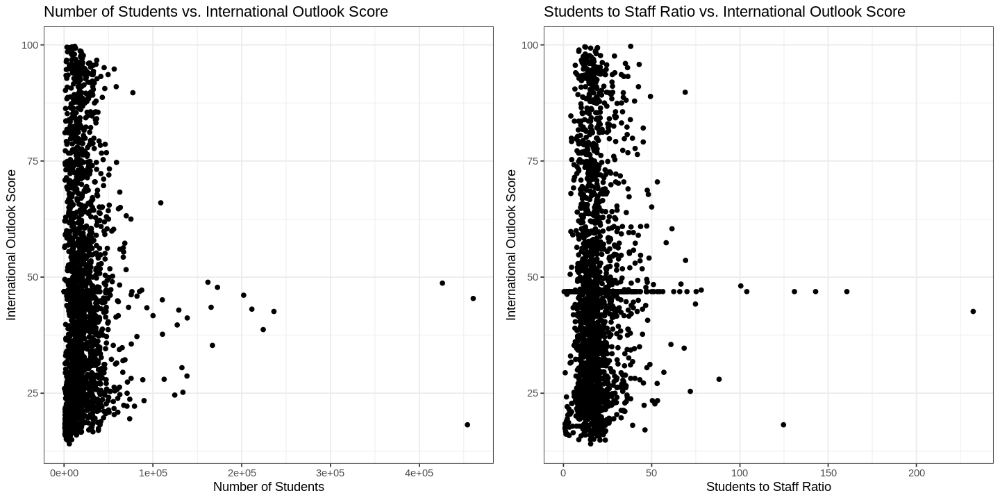

In [9]:
options(repr.plot.width= 12, repr.plot.height=6)

plot_2 <- df %>%
    ggplot(aes(x = Num_student, y = International_outlook_score)) + 
    geom_point() +
    xlab("Number of Students") +
    ylab("International Outlook Score") +
    ggtitle("Number of Students vs. International Outlook Score")

plot_3 <- df %>%
    ggplot(aes(x = No_of_student_per_staff, y = International_outlook_score)) + 
    geom_point() +
    xlab("Students to Staff Ratio") +
    ylab("International Outlook Score") +
    ggtitle("Students to Staff Ratio vs. International Outlook Score")

plot_grid(plot_2, plot_3)
                                                                                        

Now here's a scatter plot that seems to suggest a relationship between the number of international score and and the % of international students. There are a few odd-values that form a line, though that is due to the imputed values and are probably not actually significant to the relationship. Regardless, it seems that keeping the % of Internation Students feature would be a smart idea.


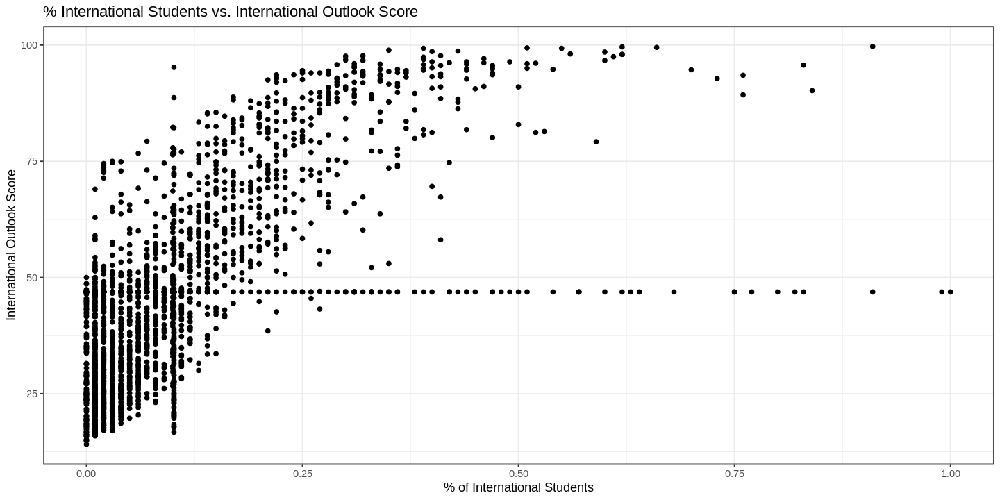

In [10]:
options(repr.plot.width= 12, repr.plot.height=6)

plot_4 <- df %>%
    ggplot(aes(x = International_student, y = International_outlook_score)) + 
    geom_point() +
    xlab("% of International Students") +
    ylab("International Outlook Score") +
    ggtitle("% International Students vs. International Outlook Score")

plot_4

All of the plots below seem to have a vaugue relationship to our target feature, some more than others. Regardless, while the relationships are not super strong, the various scoring features do seem relevent to creating a predictive model.

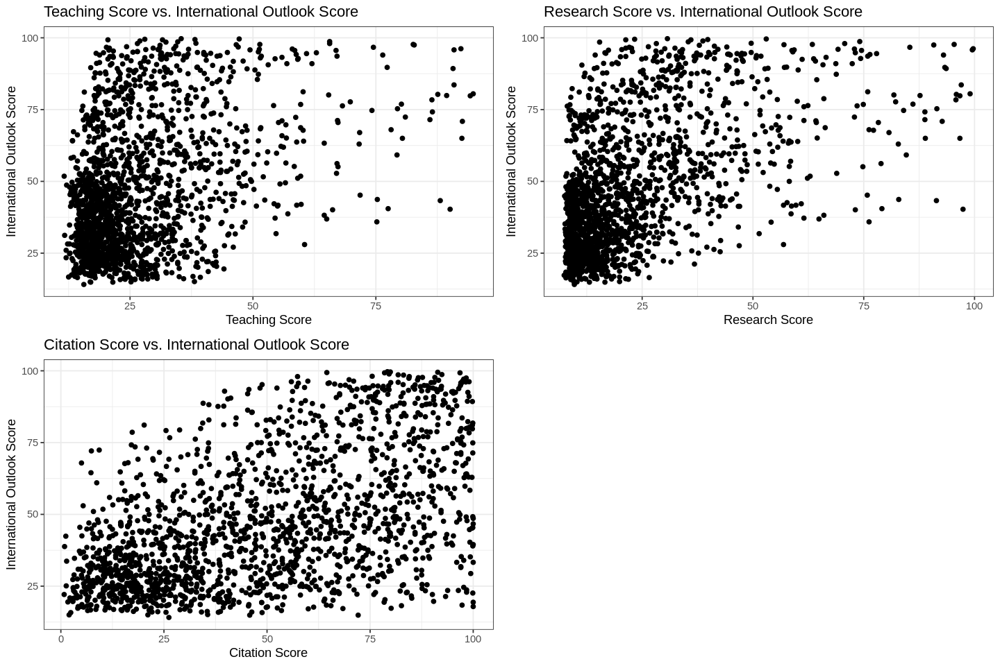

In [11]:
options(repr.plot.width= 12, repr.plot.height= 8)

plot_5 <- df%>%
    ggplot(aes(x = Teaching_score, y = International_outlook_score)) + 
    geom_point() +
    xlab("Teaching Score") +
    ylab("International Outlook Score") +
    ggtitle("Teaching Score vs. International Outlook Score")

plot_6 <- df %>%
    ggplot(aes(x = Research_score, y = International_outlook_score)) + 
    geom_point() +
    xlab("Research Score") +
    ylab("International Outlook Score") +
    ggtitle("Research Score vs. International Outlook Score")

plot_7 <- df %>%
    ggplot(aes(x = Citations_score, y = International_outlook_score)) + 
    geom_point() +
    xlab("Citation Score") +
    ylab("International Outlook Score") +
    ggtitle("Citation Score vs. International Outlook Score")

plot_grid(plot_5, plot_6, plot_7)

There is no significant pattern to be observed for Industry income score versus International outlook score. The Industry Income Score doesn't seem to have any relationship to the International Outlook Score; however, it is still a potential feature in predicting the international outlook score.

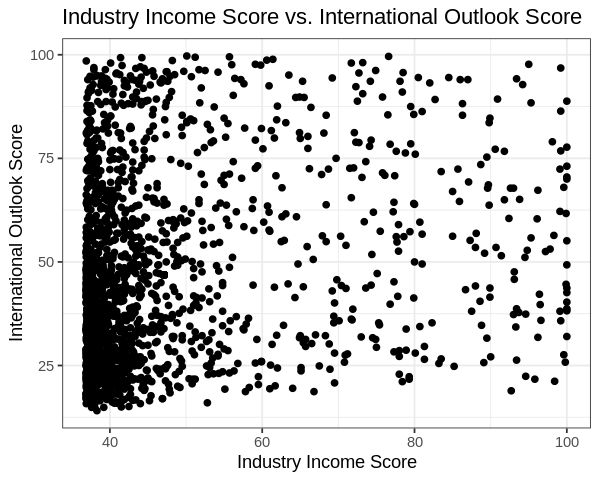

In [12]:
options(repr.plot.width= 5, repr.plot.height=4)

plot_8 <- df%>%
    ggplot(aes(x = Industry_income_score, y = International_outlook_score)) + 
    geom_point() +
    xlab("Industry Income Score") +
    ylab("International Outlook Score") +
    ggtitle("Industry Income Score vs. International Outlook Score")

plot_8

With these features being mirrors of each other, pulling them apart doesn't really seem useful. In terms of their relationship to the international outlook score it seem as though neither of them have a defined relationship to our target, so they might not be super relevent to our prospective predictive model.

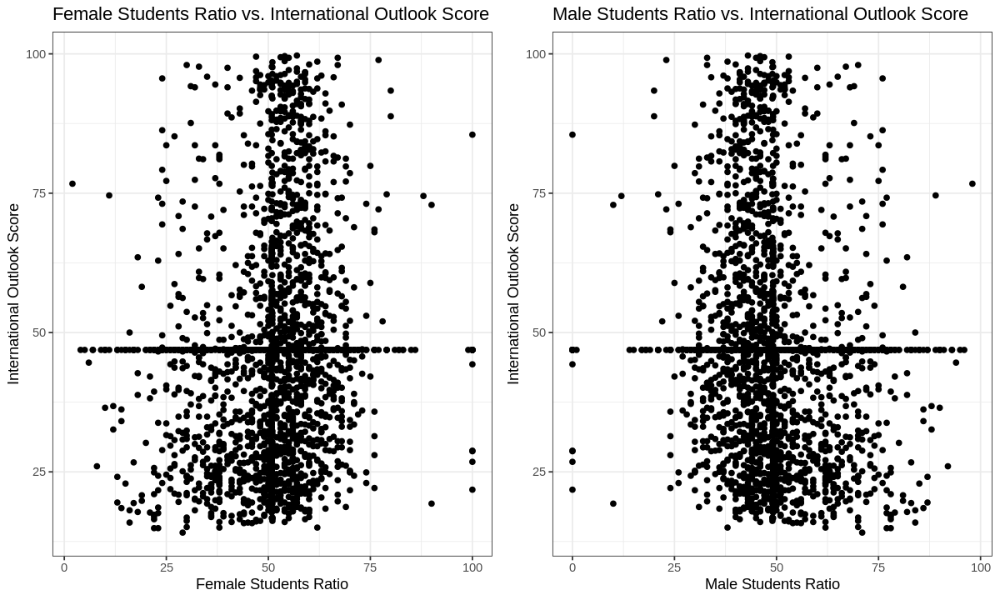

In [13]:
options(repr.plot.width= 10, repr.plot.height=6)

plot_9 <- df%>%
    ggplot(aes(x = Female_ratio, y = International_outlook_score)) + 
    geom_point() +
    xlab("Female Students Ratio") +
    ylab("International Outlook Score") +
    ggtitle("Female Students Ratio vs. International Outlook Score")

plot_10 <- df %>%
    ggplot(aes(x = Male_ratio, y = International_outlook_score)) + 
    geom_point() +
    xlab("Male Students Ratio") +
    ylab("International Outlook Score") +
    ggtitle("Male Students Ratio vs. International Outlook Score")

plot_grid(plot_9,plot_10)

There does seem to be a relatively linear relationship in the case of overall score to the international outlook score. I would imagine that is due to the fomer being in part calculated with the ladder, but regardless the relationship does seem to be relevant there. There is a slight issue to how many imputed values are introduced into the data making this relationship seem a bit rocky, but it doesn't seem like too much of streach to assume that the overall score would be useful in some predictive model.

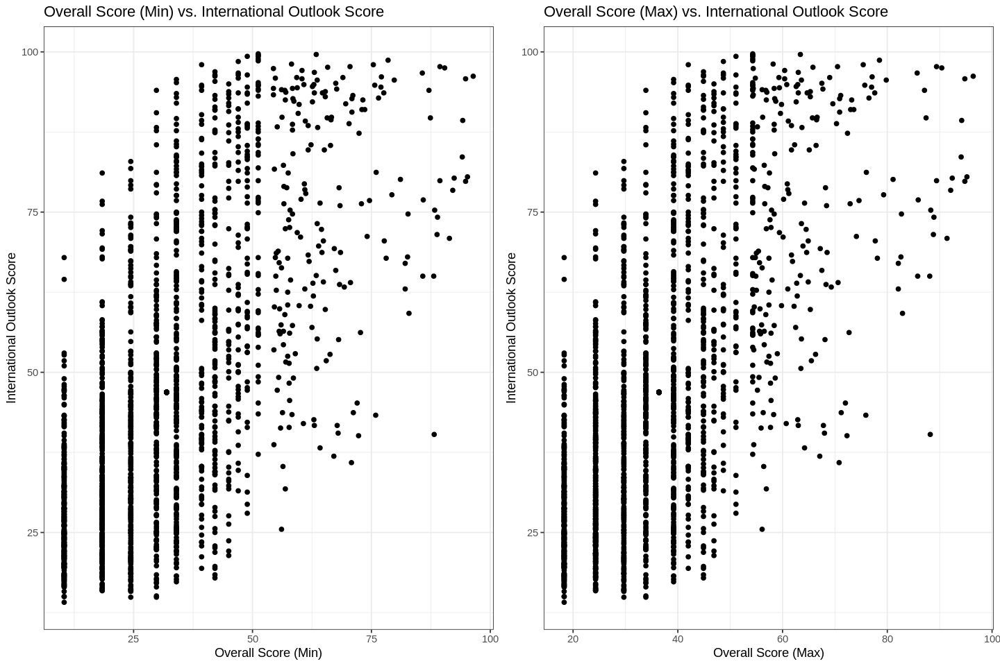

In [14]:
options(repr.plot.width= 12, repr.plot.height=8)

plot_11 <- df%>%
    ggplot(aes(x = Overall_score_min, y = International_outlook_score)) + 
    geom_point()+
    xlab("Overall Score (Min)") +
    ylab("International Outlook Score") +
    ggtitle("Overall Score (Min) vs. International Outlook Score")

plot_12 <- df %>%
    ggplot(aes(x = Overall_score_max, y = International_outlook_score)) + 
    geom_point()+
    xlab("Overall Score (Max)") +
    ylab("International Outlook Score") +
    ggtitle("Overall Score (Max) vs. International Outlook Score")

plot_grid(plot_11, plot_12)

This is a heatmap of correlations between all the scores including `International_outlook_score`(y), target value. A heatmap will indicate if the scores are linearly correlated with y, which helps decide whether we should keep the variables for the linear model. The plot demonstrates a fairly high positive correlation, 0.54, between `Citations_score`, `Research_score` and y. The least correlated explanatory variable is `Industry_income_score` with a value of 0.22. It is worth noting that `Research_score` and `Teaching_score` are highly correlated producing a correlated coefficient of 0.88. We will have to conduct further analysis into these two variables to avoid collinearity when training the model. 

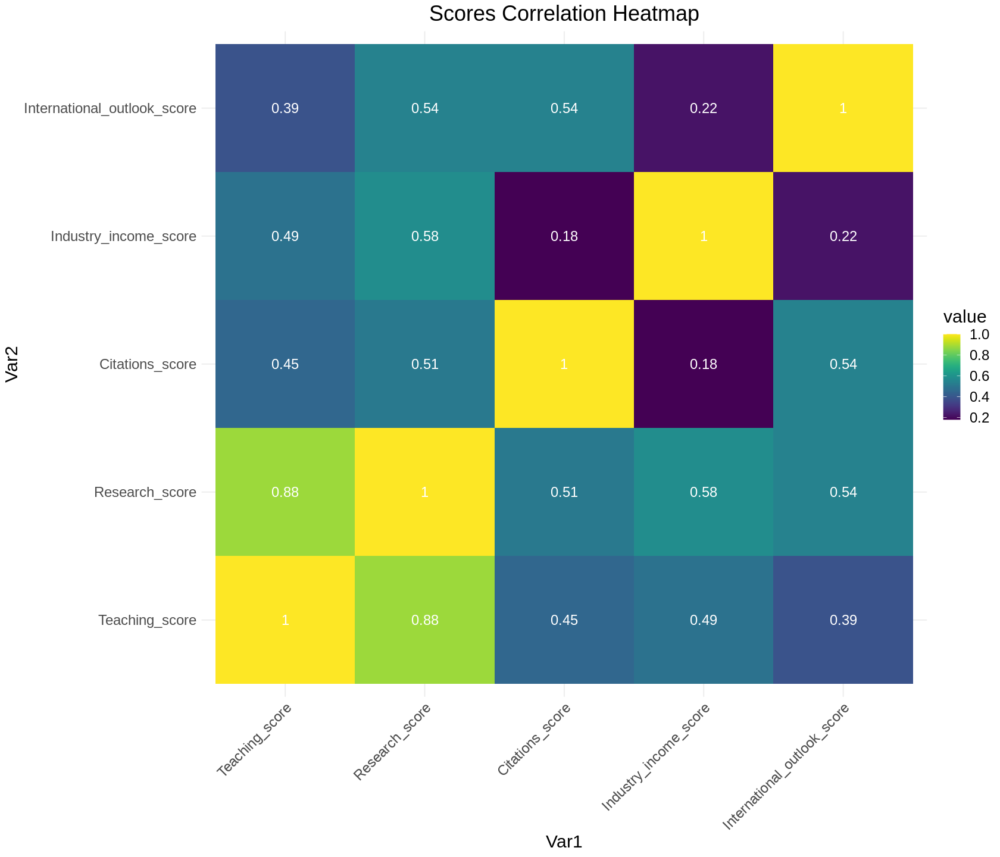

In [15]:
options(repr.plot.width = 14, repr.plot.height =12)
df_scores = df %>% select(Teaching_score, Research_score, Citations_score, Industry_income_score, International_outlook_score)
corr<- round(cor(df_scores),2)
melted_corr<- melt(corr)
ggplot(data = melted_corr, aes(x=Var1, y=Var2,
                                   fill=value)) + geom_tile() +
  theme_minimal() + theme(axis.text.x = element_text(angle = 45, hjust = 1)) +  
  labs(title = "Scores Correlation Heatmap") + geom_text(aes(Var2, Var1, label = value), 
          color = "white", size = 5) + scale_fill_viridis() +
  theme(plot.title = element_text(hjust = 0.5),text = element_text(size=18))

## Methods: Plan

**Overall this research was divided into two parts, model selection, and testing the prediction accuracy of that model. So before the whole research starts, the data set will be divided into two datasets, training and testing, in a ratio of 8:2. i.e. 80% of the data will be used for building and training the model, 20% of the data will be used for testing the model's performance.**

First of all, we need to split the dataset into training and testing set:

In [16]:
set.seed(320)
rank_split_initial <- initial_split(df, prop = 0.8, strata = International_outlook_score)
training_set <- training(rank_split_initial)
testing_set <- testing(rank_split_initial)

nrow(training_set)
nrow(testing_set)

[1] 1872

[1] 469

### **Model Selection -- Lasso**

We decided to use Lasso to select the final model because LASSO tends to compress the coefficients of some irrelevant or unimportant features to zero by adding penalty terms to the coefficients. This, in turn, effectively eliminates features that have a small impact on the explanatory variables, making the model more concise, reliable and possibly even improving its predictive power.

Before proceeding with the model selection, we need to divide the dataset again into two subsets: The first set (rank_selection) consists of 50% of the training set that will be used for model selection and the second set (rank_inference) consists of the other 50% of the training set that will be used for inference.

In [17]:
set.seed(320)
rank_split <- initial_split(training_set, prop = 0.5, strata = International_outlook_score)
rank_selection <- training(rank_split)
rank_inference <- testing(rank_split)

Run Lasso on rank_selection for model selection. And find the lambda that provides the lowest cross-validated MSE via the "cv". glmnet" function. Get the coefficients of the lasso model with the lowest MSE (from lasso_model).

In [18]:
lasso_model <-cv.glmnet(x = as.matrix(rank_selection[-8]), 
              y = as.matrix(rank_selection$International_outlook_score), 
              alpha = 1)

lasso_model


Call:  cv.glmnet(x = as.matrix(rank_selection[-8]), y = as.matrix(rank_selection$International_outlook_score),      alpha = 1) 

Measure: Mean-Squared Error 

     Lambda Index Measure    SE Nonzero
min 0.00578    84   106.8 5.525      10
1se 0.12446    51   111.7 6.160       9

In [19]:
beta_lasso = coef(lasso_model, s = lasso_model$lambda.min)

beta_lasso

12 x 1 sparse Matrix of class "dgCMatrix"
                                   s1
(Intercept)              2.187351e+01
Num_student             -8.370920e-06
No_of_student_per_staff  8.136439e-03
International_student    4.339666e+01
Teaching_score          -1.729064e+00
Research_score          -7.719814e-01
Citations_score         -1.157335e+00
Industry_income_score   -1.430924e-01
Female_ratio             5.940009e-02
Male_ratio               .           
Overall_score_min        2.461375e+00
Overall_score_max        1.822076e+00

Looking at the result of beta_lasso, we can see that the coefficient of the variable "Male_ratio" is compressed to zero, which means that the LASSO regression considers this variable to be unimportant and does not have a significant impact on the explanatory variables. This means that we will eliminate "Male_ratio" from the variable selection process.

### **Model Fitting**

Extracts the name of the covariates selected by Lasso.

In [20]:
lasso_selected_covariates <- as_tibble(
        as.matrix(beta_lasso),
        rownames='covariate') %>%
        filter(covariate != '(Intercept)' & abs(s1) !=0) %>% 
        pull(covariate)


lasso_selected_covariates

[1] "Num_student"             "No_of_student_per_staff"
 [3] "International_student"   "Teaching_score"         
 [5] "Research_score"          "Citations_score"        
 [7] "Industry_income_score"   "Female_ratio"           
 [9] "Overall_score_min"       "Overall_score_max"

Lasso can still fit linear models on datasets with a high levels of multicollinearity. So in order to avoid the problem of multicollinearity in our model, we will check the variance inflator factor of the variables selected by Lasso before we conduct further tests of the accuracy of our model predictions.

In [21]:
lasso_variables_vif <- 
   vif(lm(rank_inference$International_outlook_score~.,data=select(rank_inference,all_of(lasso_selected_covariates))))

lasso_variables_vif

Num_student No_of_student_per_staff   International_student 
               1.182955                1.212993                1.382296 
         Teaching_score          Research_score         Citations_score 
               7.703049               18.331182               25.555606 
  Industry_income_score            Female_ratio       Overall_score_min 
               1.759361                1.059516              448.276585 
      Overall_score_max 
             464.572655

Looking at our initial inspection of the VIF values of the selected variables, we can see that there are a number of variables here that have high VIF values, such as Teaching_score, Research_score, Citations_score, Overall_score_min and Overall_score_max. We choose to delete the variable "Overall_score_max" which has the highest VIF value. After deleting the variables, we check the VIF values of the remaining variables again.

In [22]:
lasso_variables_vif2 <- 
   vif(lm(rank_inference$International_outlook_score~.-Overall_score_max,data=select(rank_inference,all_of(lasso_selected_covariates))))

lasso_variables_vif2

Num_student No_of_student_per_staff   International_student 
               1.180524                1.212975                1.361501 
         Teaching_score          Research_score         Citations_score 
               7.396134               17.223736               24.574013 
  Industry_income_score            Female_ratio       Overall_score_min 
               1.729303                1.059460               73.865737

This time, we see that there are still many highly correlated variables, so we need to delete the variable with the highest VIF value "Overall_score_min" again, and check the VIF values of the remaining variables again.

In [23]:
lasso_variables_vif3 <- 
   vif(lm(rank_inference$International_outlook_score~.-Overall_score_max-Overall_score_min,data=select(rank_inference,all_of(lasso_selected_covariates))))

lasso_variables_vif3

Num_student No_of_student_per_staff   International_student 
               1.171884                1.212961                1.236791 
         Teaching_score          Research_score         Citations_score 
               4.639802                6.407325                1.464127 
  Industry_income_score            Female_ratio 
               1.716346                1.055595

The results above show a significant improvement in the VIF values of the remaining variables compared to the previous two VIFs, but there are still highly correlated variables (Teaching_score and Research_score). Based on the criteria, Research_score was deleted.

In [24]:
lasso_variables_vif4 <- 
   vif(lm(rank_inference$International_outlook_score~.-Overall_score_max-Overall_score_min-Research_score,data=select(rank_inference,all_of(lasso_selected_covariates))))
lasso_variables_vif4

Num_student No_of_student_per_staff   International_student 
               1.170834                1.173195                1.164898 
         Teaching_score         Citations_score   Industry_income_score 
               1.720236                1.302169                1.419548 
           Female_ratio 
               1.055356

Each of the VIF values shown in the results above is close to 1. This indicates that there is now no presence of multicollinearity between the independent variables. So we can now fit the model using the retained variables.

In [25]:
final_inference_model<-lm(rank_inference$International_outlook_score~.-Overall_score_max-Overall_score_min-Research_score,data=select(rank_inference,all_of(lasso_selected_covariates)))

In [26]:
print("Table 4: Selected Model")
tidy(final_inference_model, conf.int = TRUE) %>% mutate_if(is.numeric, round, 3)

[1] "Table 4: Selected Model"


term,estimate,std.error,statistic,p.value,conf.low,conf.high
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
(Intercept),13.567,2.687,5.049,0.000,8.293,18.841
Num_student,0.000,0.000,-1.439,0.150,0.000,0.000
No_of_student_per_staff,0.098,0.042,2.348,0.019,0.016,0.180
International_student,72.150,3.670,19.662,0.000,64.949,79.352
Teaching_score,0.093,0.051,1.838,0.066,-0.006,0.193
Citations_score,0.296,0.020,14.505,0.000,0.256,0.336
Industry_income_score,0.049,0.039,1.256,0.209,-0.027,0.125
Female_ratio,0.115,0.036,3.181,0.002,0.044,0.186


The result shows that the number of students per professor, the number of international students, Citation Score, and Proportion of Female Students are statistically significantly associated with International Outlook Score of the university. Although the number of students, teaching score and industry income score have p-value larger than the 5% significance level, and do not appear to have a significant effect on the university's international perspective score, we still need to keep these variables in the model. Since the model was built after the variable selection through LASSO in the rank_selection dataset, removing the non-significant variables and refit the model with them will undermine the reliability of inferential statistics.

### **Assumption testing**

**Test for Linearity and Homoscedasticity:**

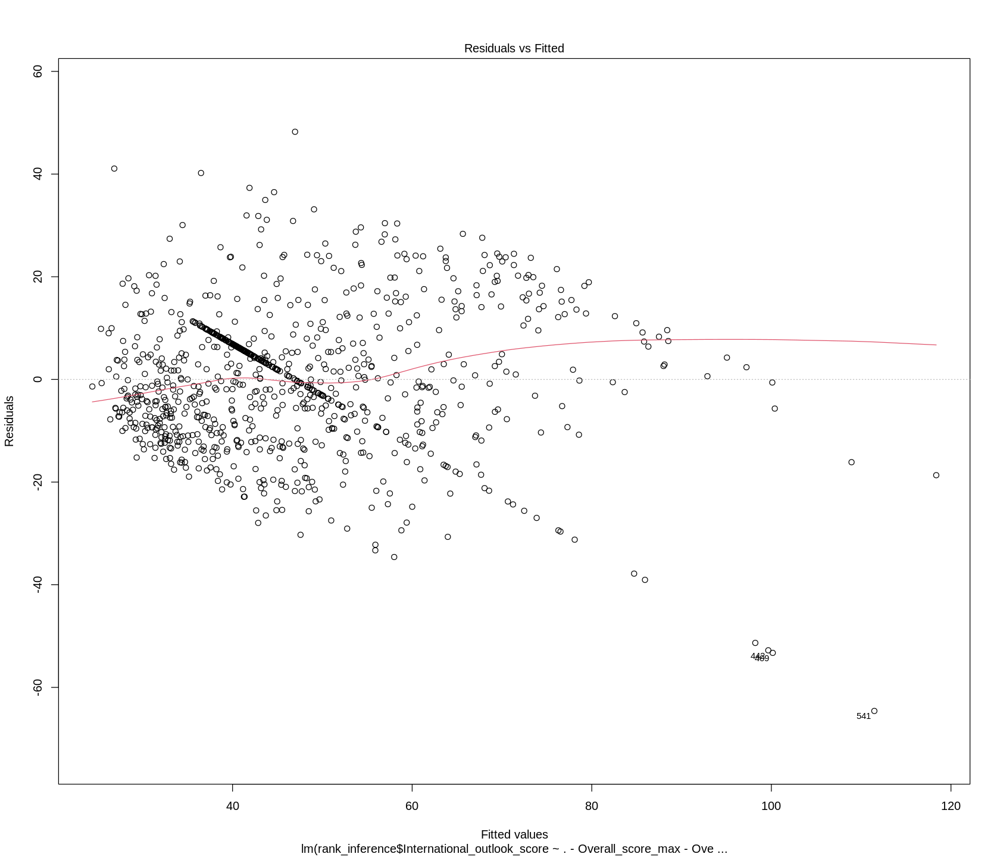

In [27]:
plot(final_inference_model,1)

**Test for Normality:**

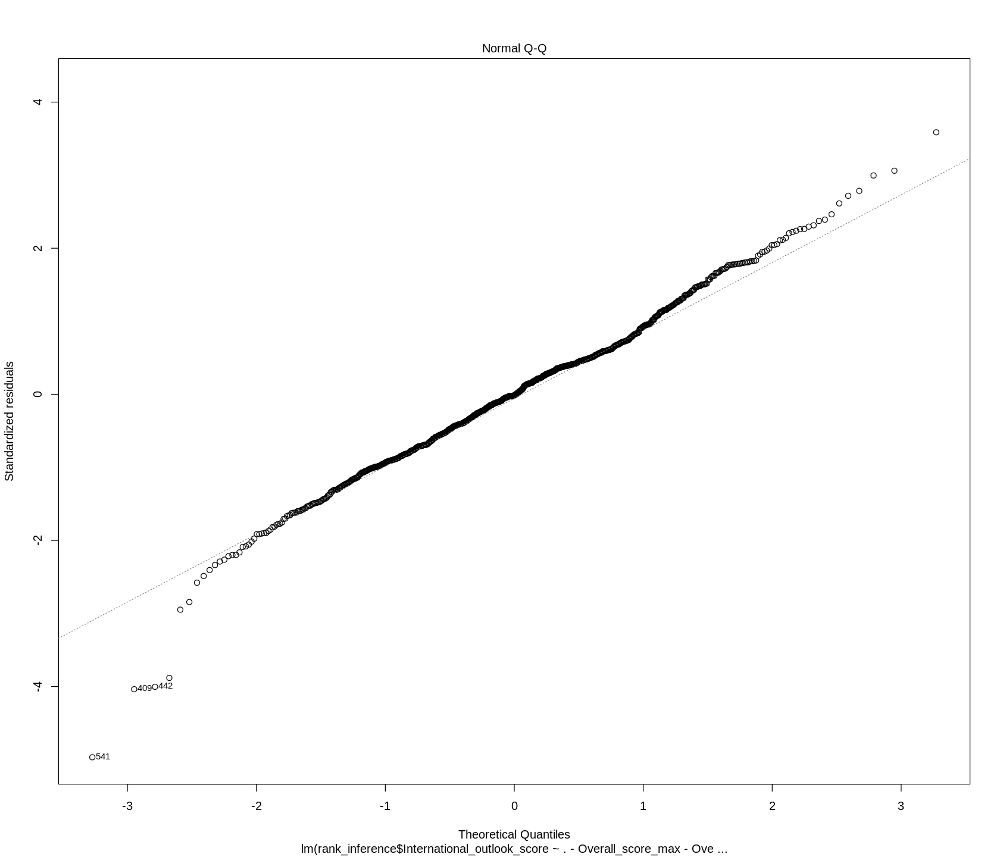

In [28]:
plot(final_inference_model,2)

### **Cross-Validation**

We will use the k-fold cross-validation to estimate the model's ability to generalize to an independent dataset by evaluating its performance across different subsets of the data. Here, we are using k=10.

In [36]:
set.seed(320)
train_control <- trainControl(method="cv", number = 10)

model_10CV <- train(International_outlook_score ~ Num_student+No_of_student_per_staff+International_student+Teaching_score+Citations_score+Industry_income_score+Female_ratio,
                    data=rank_inference, 
               trControl=train_control, method="lm")

print(model_10CV)

Linear Regression 

937 samples
  7 predictor

No pre-processing
Resampling: Cross-Validated (10 fold) 
Summary of sample sizes: 844, 843, 843, 844, 843, 844, ... 
Resampling results:

  RMSE      Rsquared   MAE     
  13.61685  0.5358159  10.55778

Tuning parameter 'intercept' was held constant at a value of TRUE


The output from 10-fold cross-validation indicates that the linear regression model yields the Root Mean Squared Error (RMSE) of **13.61685**, suggesting a moderate level of prediction error for the training data.

### **Prediction Performance**

We will now compute the Root Mean Squared Error (RMSE) to test the model's performance on entirely new data (testing_set) that it has never seen before, which is the ultimate test of its predictive power.

In [37]:
rank_test_pred_OLS <- predict(final_inference_model, newdata = testing_set)
head(rank_test_pred_OLS)

1         2         3         4         5         6 
 84.89389  85.21754  81.03525  70.13703  69.91209 101.71210

In [40]:
rank_R_MSE_model <- tibble(
  Model = "MLR",
  R_MSE = rmse(
    preds = rank_test_pred_OLS,
    actuals = testing_set$International_outlook_score
  )
)
print("Table 5: ")
rank_R_MSE_model

[1] "Table 5: "


Model,R_MSE
<chr>,<dbl>
MLR,12.90659


Based on our result in `rank_R_MSE_model`, the prediction RMSE on the test set is **12.90659**, which is lower than the CV RMSE, indicating that the model performs consistently on unseen data, which is a positive indicator of its predictive reliability. 

## Reference:

Syed Ali Taqi. (2023). <i>World University Rankings 2023</i> [Data set]. Kaggle. https://doi.org/10.34740/KAGGLE/DSV/6394958 <br>
https://www.kaggle.com/datasets/samiatisha/world-university-rankings-2023-clean-dataset